In [5]:
!pip install facenet-pytorch yt-dlp


In [7]:
!pip uninstall -y pillow
!pip install pillow --upgrade


Found existing installation: pillow 10.2.0
Uninstalling pillow-10.2.0:
  Successfully uninstalled pillow-10.2.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 69.8 MB/s eta 0:00:00:00:010:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.8.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
facenet-pytorch 2.6.0 requires Pillow<10.3.0,>=10.2.0, but you have pillow 11.3.0 which is incompatible.
dopamine-rl 4.1.2 requires gymnasium>=1.0.0, but you have gymnasium 0.29.0 which is incompatible.
plotnine 0.14.5 requires matplotlib>=3.8.0, but you have matplotlib 3.7.2 which is incompatible.
bigframes 2.8.0 requires google-cloud-bigquery[bqstorage,pandas]>=3.31.0, but you have google-cloud-bigquery 3.25.0 which is incompatible.
bigframes 2.8.0 requires rich<14,>=12.4.4, but you have rich 14.0.0 which is incompatible.
m

In [8]:
import os
import sys
import shutil
import subprocess
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from torchvision.io import read_image
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid
from facenet_pytorch import MTCNN, InceptionResnetV1
from IPython.display import Video




In [9]:
print("Platform:", sys.platform)
print("Python version:", sys.version)
print("torch version : ", torch.__version__)
print("torchvision version : ", torchvision.__version__)

print("cv2 version : ", cv2.__version__)
!python --version


Platform: linux
Python version: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
torch version :  2.2.2+cu121
torchvision version :  0.17.2+cu121
cv2 version :  4.11.0
Python 3.11.13


**Use G P U**

In [10]:
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"

print(f"Using {device} device.")

Using cpu device.


**Fetching YouTube Video Data**

In [12]:
project_dir = Path("project")
data_dir = project_dir / "data"


data_dir.mkdir(parents=True, exist_ok=True)


print(f"path was created {data_dir}")


path was created project/data


In [14]:
project_dir= Path("project")
video_dir=project_dir / "data"
print(video_dir)
print(project_dir)

project/data
project


In [15]:
!ls -l project/data/

total 0


In [16]:
video_url = "https://www.youtube.com/watch?v=5rGNDuRB_GY"
output_path = str(video_dir/ "yawmiaat wanis.mp4")


!yt-dlp -f best -o "{output_path}" {video_url}


         To let yt-dlp download and merge the best available formats, simply do not pass any format selection.
         If you know what you are doing and want only the best pre-merged format, use "-f b" instead to suppress this warning
[youtube] Extracting URL: https://www.youtube.com/watch?v=5rGNDuRB_GY
[youtube] 5rGNDuRB_GY: Downloading webpage
[youtube] 5rGNDuRB_GY: Downloading tv client config
[youtube] 5rGNDuRB_GY: Downloading player a1f2424c-main
[youtube] 5rGNDuRB_GY: Downloading tv player API JSON
[youtube] 5rGNDuRB_GY: Downloading ios player API JSON
[youtube] 5rGNDuRB_GY: Downloading m3u8 information
[info] 5rGNDuRB_GY: Downloading 1 format(s): 18
[download] Destination: project/data/yawmiaat wanis.mp4
[download] 100% of  145.32MiB in 00:00:22 at 6.34MiB/s0;33m00:000m


display the vidue

In [ ]:
from IPython.display import Video
Video(output_path, width=500, embed=True)


Buffered data was truncated after reaching the output size limit.

**cut_video function**

In [17]:
def cut_video(input_file, output_file, start_time, duration):
    """
    Cuts a portion of the video.

    :parameter input_file: Path to the input video file.
    :parameter output_file: Path to the output video file.
    :parameter start_time: Start time of the cut in seconds or in `HH:MM:SS` format.
    :parameter duration: Duration of the cut in seconds or in `HH:MM:SS` format.
    """
    command = [
        "ffmpeg",
        "-ss",
        str(start_time),
        "-i",
        input_file,
        "-t",
        str(duration),
        "-c",
        "copy",
        output_file,
    ]
    subprocess.run(command)


#cut_video?

In [18]:
input_file = "project/data/yawmiaat wanis.mp4"
output_file = "project/data/output.mp4"

# قصّ 10 ثوانٍ من الثانية 30
cut_video(input_file, output_file, start_time="00:00:00", duration="00:01:00")


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [19]:
from IPython.display import Video

# مسار الفيديو الذي تم تحميله
output_video = "project/data/output.mp4"

# عرض الفيديو داخل الدفتر (embed=True)
Video(output_video, width=500, embed=True)

**Create a video capture for the one minute video**

In [20]:
output_video="project/data/output.mp4"
video_capture = cv2.VideoCapture(output_video)

if not video_capture.isOpened():
    print("Error: Could not open video.")
else:
    frame_rate = video_capture.get(cv2.CAP_PROP_FPS)
    frame_count = int(video_capture.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Frame rate: {frame_rate}")
    print(f"Total number of frames: {frame_count}")

Frame rate: 25.0
Total number of frames: 1500


** Use the video capture variable you defined in the previous task and fetch the first frame. **

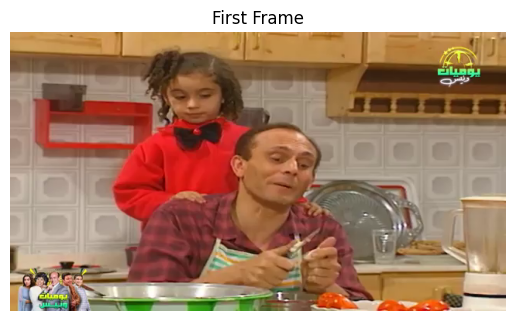

In [21]:
ret, first_frame = video_capture.read()

if ret:
    plt.imshow(cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB))
    plt.title("First Frame")
    plt.axis("off")
    plt.show()
else:
    print("Error: Could not read frame.")

In [22]:
height, width, channel = first_frame.shape

print("frames height : ", height)
print("frames width : ", width)
print("frames channel : ", channel)

frames height :  360
frames width :  640
frames channel :  3


**Create a directory path for the extracted frames using the pathlib syntax**

In [23]:
frames_dir = video_dir/"extracted_frames"

frames_dir.mkdir(exist_ok=True)
print(frames_dir)

project/data/extracted_frames


**saves every fifth frame from the video.**

In [24]:
interval = frame_rate * 0.20  # Extract every fifth frame from the video
frame_count = 0

print("Start extracting individual frames...")
while True:
    # read next frame from the video_capture
    ret, frame = video_capture.read()
    if not ret:
        print("Finished!")
        break  # Break the loop if there are no more frames

    # Save frames at every 'interval' frames
    if frame_count % interval == 0:
        frame_path = frames_dir / f"frame_{frame_count}.jpg"
        cv2.imwrite(frame_path, frame)

    frame_count += 1

video_capture.release()

Start extracting individual frames...
Finished!


**Compute the number of frames**

In [25]:
frames_dir.iterdir()

<generator object Path.iterdir at 0x7a4b5f028900>

In [26]:
def display_sample_images(dir_path, sample=5):
    image_list = []
    images = sorted(dir_path.iterdir())
    if images:
        sample_images = images[:sample]
        for sample_image in sample_images:
            image = read_image(str(sample_image))

            # Define resizing transformation that resizes to 240 x 240
            resize_transform = transforms.Resize((240, 240))
            # Resize image by using `resize_transform`
            image = resize_transform(image)
            image_list.append(image)
    grid = make_grid(image_list, nrow=5)
    image = to_pil_image(grid)
    return image


#display_sample_images?

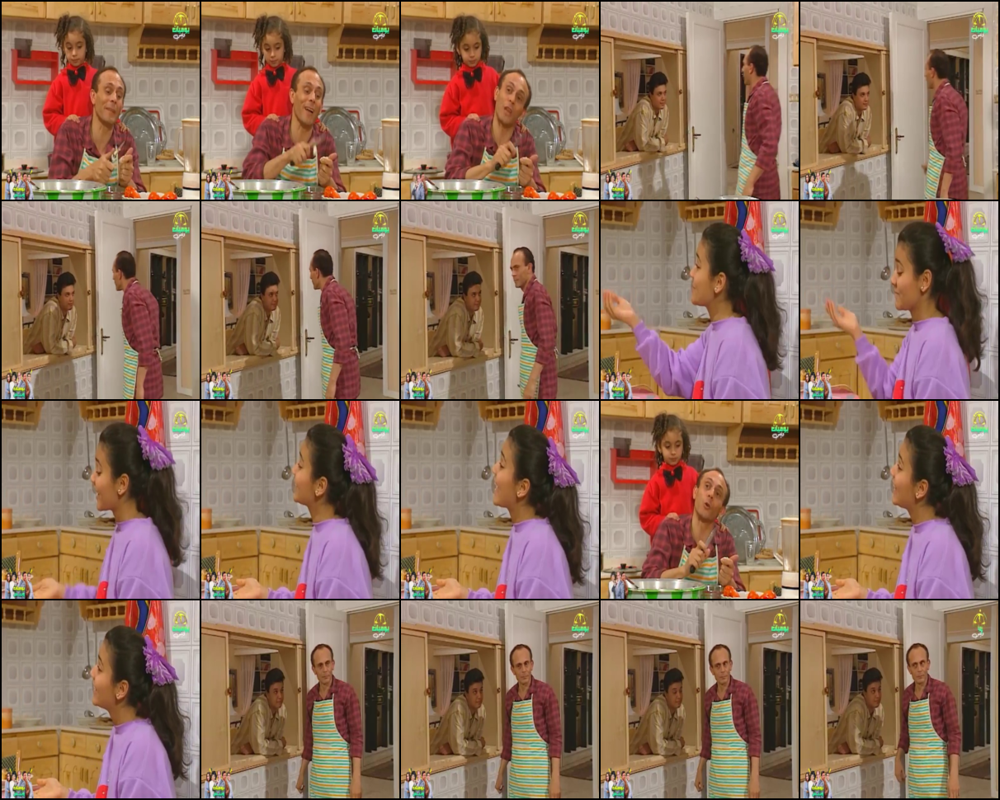

In [27]:
# Call function `display_sample_images` on `frames_dir`
display_sample_images(frames_dir, sample=20)

In [28]:
mtcnn = MTCNN(device=device , keep_all=True, min_face_size=60, post_process=False)

print(mtcnn)

MTCNN(
  (pnet): PNet(
    (conv1): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=10)
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(10, 16, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=16)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (prelu3): PReLU(num_parameters=32)
    (conv4_1): Conv2d(32, 2, kernel_size=(1, 1), stride=(1, 1))
    (softmax4_1): Softmax(dim=1)
    (conv4_2): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
  )
  (rnet): RNet(
    (conv1): Conv2d(3, 28, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=28)
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(28, 48, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=48)
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv3): Conv2d(48, 64,

In [29]:
curr_work_dir = Path.cwd()

print("curr_work_dir= ",curr_work_dir)

curr_work_dir=  /kaggle/working


**Create an absolute path for the extracted_frames**

In [30]:
extracted_frames_dir = curr_work_dir/ "project"/"data"/"extracted_frames"
print(extracted_frames_dir)

/kaggle/working/project/data/extracted_frames


Create a file path to the sample image

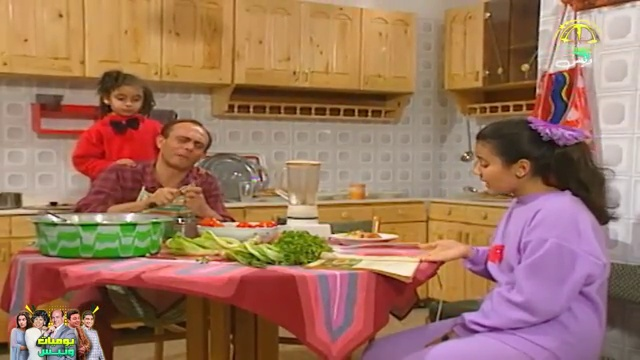

In [31]:
sample_image_filename = "frame_320.jpg"
sample_image_path = extracted_frames_dir/sample_image_filename

sample_image = Image.open(sample_image_path)
sample_image

Use the detect method on the MTCNN model

In [32]:
boxes, probs = mtcnn.detect(sample_image)

print("boxes type:", type(boxes))
print("probs type:", type(probs))

boxes type: <class 'numpy.ndarray'>
probs type: <class 'numpy.ndarray'>


In [33]:
print(boxes)
print(boxes.shape)

[[473.73150634765625 137.81263732910156 511.9655456542969
  197.62525939941406]
 [166.2360382080078 124.68181610107422 202.2393035888672
  166.63644409179688]
 [111.31050109863281 84.21898651123047 141.13751220703125
  118.85768127441406]]
(3, 4)


Using boxes, compute how many faces

In [34]:
number_of_detected_faces = len(boxes)

print(number_of_detected_faces)

3


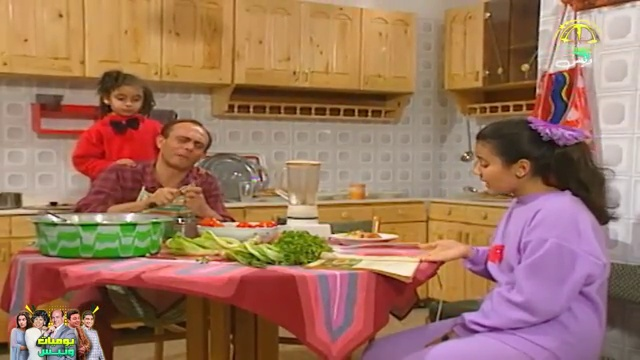

In [35]:
sample_image

In [37]:
probs[probs>0.99]
num_faces = len(probs[probs>0.99])

print(num_faces)

3


iterate over all of the bounding boxes and plot them on top of the sample image.

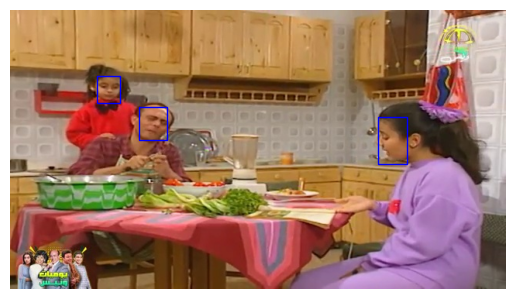

In [38]:
fig, ax = plt.subplots()
ax.imshow(sample_image)

for box in boxes:
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
plt.axis("off");

**Extracting Facial Landmarks**

Use the detect method on the MTCNN model such that we'll get bounding boxes, probabilities and facial landmarks returned.

In [39]:
boxes, probs, landmarks = mtcnn.detect(sample_image,landmarks=True)

print("boxes type:", type(boxes))
print("probs type:", type(probs))
print("landmarks type:", type(landmarks))

boxes type: <class 'numpy.ndarray'>
probs type: <class 'numpy.ndarray'>
landmarks type: <class 'numpy.ndarray'>


In [40]:
print(landmarks.shape)

(3, 5, 2)


plot the bounding boxes as well as the facial landmarks on top of the sample image.

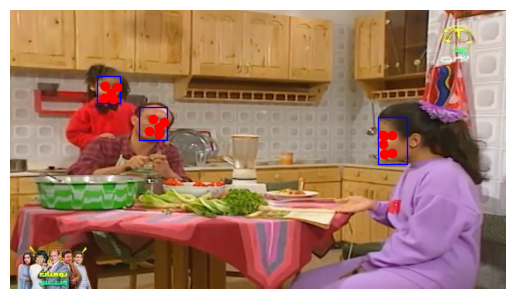

In [41]:
fig, ax = plt.subplots()
ax.imshow(sample_image)

for box, landmark in zip(boxes, landmarks):
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
    for point in landmark:
        ax.plot(point[0], point[1], marker="o", color="red")
plt.axis("off");

**Cropping out Detected Faces**

Use the MTCNN model that we initialized in the first task and pass it the sample_image.

In [43]:
faces = mtcnn(sample_image)

print(faces.shape)

torch.Size([3, 3, 160, 160])


Create a grid of these three images by using make_grid from torchvision.

In [44]:
Grid = make_grid(faces)

print(Grid.shape)

torch.Size([3, 164, 488])


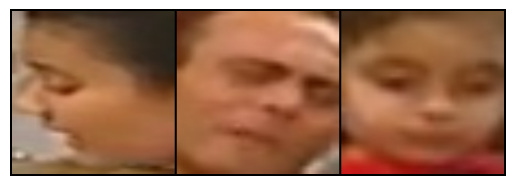

In [45]:
plt.imshow(Grid.permute(1, 2, 0).int())
plt.axis("off");

Prepare a Subset of Images for Next Steps

 Make a directory into which we'll put the selected images

In [47]:
images_dir = curr_work_dir / "project" / "data" / "images"
images_dir.mkdir(exist_ok=True)

Make a subdirectory in the images directory and call it mary_kom

In [49]:
wanis_dir = images_dir/ 'wanis'
wanis_dir.mkdir(exist_ok=True)
azz_dir = images_dir/"azz"
azz_dir.mkdir(exist_ok=True)
hoda_dir = images_dir/"Hoda"
hoda_dir.mkdir(exist_ok=True)
sharf_dir = images_dir/"sharf"
sharf_dir.mkdir(exist_ok=True)
gehad_dir = images_dir/"gehad"
gehad_dir.mkdir(exist_ok=True)

In [51]:
import math

def display_images_from_folder(folder_path, num_images=10, figsize=(15, 8)):
    """
    Display a number of images from a specific folder.

    Args:
        folder_path (str or Path): The path to the folder containing the images.
        num_images (int): Number of images to display.
        figsize (tuple): Size of the final figure displaying the images.
    """
    folder_path = Path(folder_path)
    
    # Get image paths (jpg, png)
    image_paths = list(folder_path.glob("*.jpg")) + list(folder_path.glob("*.png"))
    
    if not image_paths:
        print("⚠️ No images found in this folder.")
        return

    # Limit to available images
    image_paths = image_paths[:num_images]
    num_images = len(image_paths)
    
    # Auto calculate rows and columns
    cols = min(5, num_images)
    rows = math.ceil(num_images / cols)

    # Display the images
    plt.figure(figsize=figsize)
    for i, img_path in enumerate(image_paths):
        img = Image.open(img_path)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(img_path.name[:15])  # Limit long titles

    plt.tight_layout()
    plt.show()

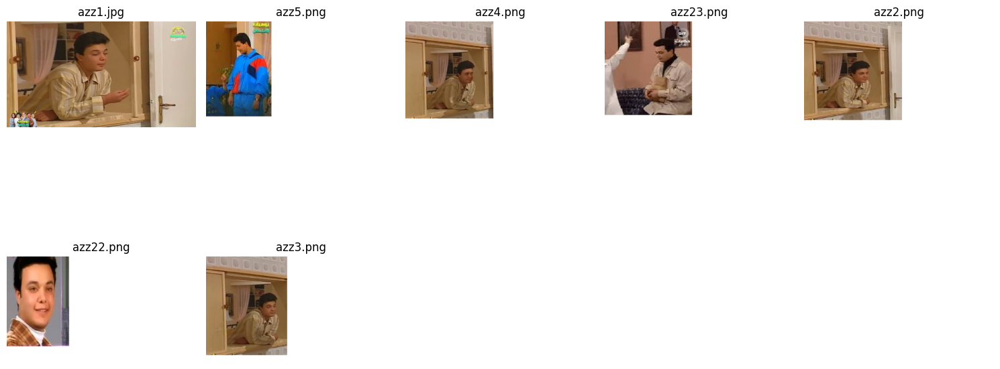

In [52]:
display_images_from_folder('/kaggle/input/azzeldean', num_images=10)


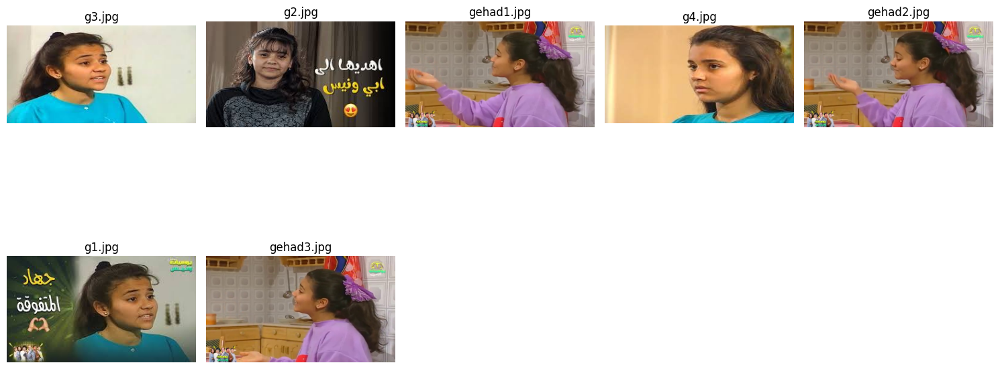

In [54]:
display_images_from_folder('/kaggle/input/gehad2', num_images=10)



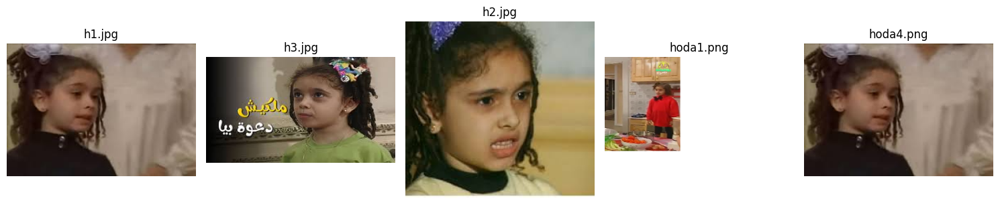

In [56]:
display_images_from_folder('/kaggle/input/hoda11', num_images=10)

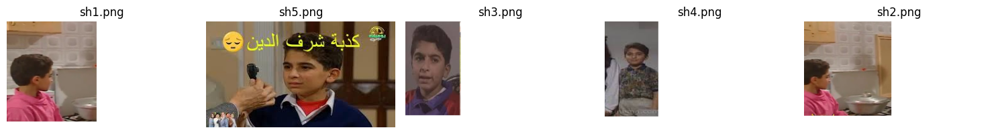

In [57]:
display_images_from_folder('/kaggle/input/shereaf', num_images=10)

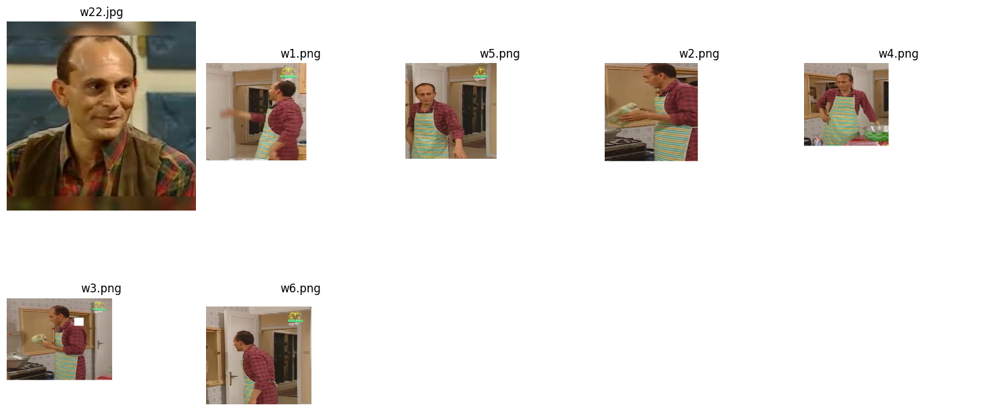

In [58]:
display_images_from_folder('/kaggle/input/wanis2', num_images=10)

Iterate over mary_kom_imgs list of image filenames and create a list of absolute paths to each image using pathlib syntax.

In [60]:

mtcnn0 = MTCNN(image_size=240, keep_all=False, min_face_size=40)
print(mtcnn0)

MTCNN(
  (pnet): PNet(
    (conv1): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=10)
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(10, 16, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=16)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (prelu3): PReLU(num_parameters=32)
    (conv4_1): Conv2d(32, 2, kernel_size=(1, 1), stride=(1, 1))
    (softmax4_1): Softmax(dim=1)
    (conv4_2): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
  )
  (rnet): RNet(
    (conv1): Conv2d(3, 28, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=28)
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(28, 48, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=48)
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv3): Conv2d(48, 64,

In [61]:
resnet = InceptionResnetV1(pretrained="vggface2").eval()

  0%|          | 0.00/107M [00:00<?, ?B/s]

**Preparing our Data**

Create a path object for the path project4/data/images/

In [63]:
import shutil
from pathlib import Path

def move_images_from_input_to_output(input_subdir: str, output_subdir: str = "output"):
    """
    Moves all image files (jpg, jpeg, png) from a subdirectory inside /kaggle/input
    to a subdirectory inside /kaggle/working.

    Parameters:
    - input_subdir: folder name under /kaggle/input
    - output_subdir: folder name to create under /kaggle/working (default is 'output')
    """
    input_dir = Path(f"/kaggle/input/{input_subdir}")
    output_dir = Path(f"/kaggle/working/{output_subdir}")
    output_dir.mkdir(parents=True, exist_ok=True)

    image_extensions = ['.jpg', '.jpeg', '.png']
    moved_count = 0

    for img_path in input_dir.rglob("*"):
        if img_path.suffix.lower() in image_extensions:
            shutil.copy(img_path, output_dir / img_path.name)
            moved_count += 1

    print(f"✅ Moved {moved_count} images to: {output_dir}")


In [65]:
move_images_from_input_to_output(
    input_subdir="azzeldean",
    output_subdir="project/data/images/azz"
)


✅ Moved 7 images to: /kaggle/working/project/data/images/azz


In [68]:
move_images_from_input_to_output(
    input_subdir="gehad2",
    output_subdir="project/data/images/gehad"
)


✅ Moved 7 images to: /kaggle/working/project/data/images/gehad


In [69]:
move_images_from_input_to_output(
    input_subdir="hoda11",
    output_subdir="project/data/images/Hoda"
)

✅ Moved 5 images to: /kaggle/working/project/data/images/Hoda


In [70]:
move_images_from_input_to_output(
    input_subdir="wanis2",
    output_subdir="project/data/images/wanis"
)

✅ Moved 7 images to: /kaggle/working/project/data/images/wanis


In [71]:
move_images_from_input_to_output(
    input_subdir="shereaf",
    output_subdir="project/data/images/sharf"
)

✅ Moved 5 images to: /kaggle/working/project/data/images/sharf


In [73]:
images_folder = Path("project","data","images")

print(f"Path to images: {images_folder}")

Path to images: project/data/images


Create an ImageFolder object for the path object

In [74]:
dataset = datasets.ImageFolder(images_folder)

print(dataset)

Dataset ImageFolder
    Number of datapoints: 31
    Root location: project/data/images


With a ImageFolder object, the .class_to_idx is a mapping between class label to class integer.

In [75]:
dataset.class_to_idx

{'Hoda': 0, 'azz': 1, 'gehad': 2, 'sharf': 3, 'wanis': 4}

Create a dictionary that maps integer to class label.

In [76]:
idx_to_class = {i: c for c, i in dataset.class_to_idx.items()}

print(idx_to_class)

{0: 'Hoda', 1: 'azz', 2: 'gehad', 3: 'sharf', 4: 'wanis'}


In [77]:
def collate_fn(x):
    return x[0]

Construct a DataLoader object with the previously created dataset

In [78]:
loader = DataLoader(dataset,collate_fn=collate_fn)

print(loader.dataset)

Dataset ImageFolder
    Number of datapoints: 31
    Root location: project/data/images


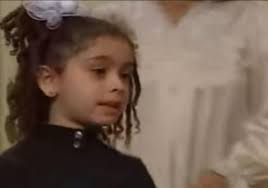

In [79]:
img, _ = iter(loader).__next__()
img

Use mtcnn0 to detect the face and probability.

In [80]:
face, prob = mtcnn0(img, return_prob=True)

print(type(face))
print(f"Probability of detected face: {prob}")

<class 'torch.Tensor'>
Probability of detected face: 0.9999992847442627


**Running the Inception-ResNet V1 model**

In [81]:
try:
    resnet(face)
except ValueError as e:
    print(e)

expected 4D input (got 3D input)


Print out the shape of our face tensor.

In [82]:
print(face.shape)

torch.Size([3, 240, 240])


Change the shape of the tensor from [3, 240, 240] to [1, 3, 240, 240].

In [83]:
face_4d = face.unsqueeze(0)

print(face_4d.shape)

torch.Size([1, 3, 240, 240])


In [84]:
embedding = resnet(face_4d)

print(f"Shape of face embedding: {embedding.shape}")

Shape of face embedding: torch.Size([1, 512])


Filter out results in which face is None or where the probability is less than 0.90.

In [85]:
# Dictionary that maps name to list of their embeddings
name_to_embeddings = {name: [] for name in idx_to_class.values()}

for img, idx in loader:
    face, prob = mtcnn0(img, return_prob=True)
    if face is not None and prob >=0.9:
        emb = resnet(face.unsqueeze(0))
        name_to_embeddings[idx_to_class[idx]].append(emb)

In [86]:
print(name_to_embeddings.keys())
print(type(name_to_embeddings["azz"]))

dict_keys(['Hoda', 'azz', 'gehad', 'sharf', 'wanis'])
<class 'list'>


Take the list of embeddings for both Mary and Ranveer and convert each list to a 2D PyTorch tensor by using torch.stack

In [87]:
embeddings_Hoda = torch.stack(name_to_embeddings["Hoda"])
embeddings_Hoda_shape = embeddings_Hoda.shape
print(f"Shape of stack of embeddings for Hoda: {embeddings_Hoda_shape}")

embeddings_azz = torch.stack(name_to_embeddings["azz"])
embeddings_azz_shape = embeddings_azz.shape
print(f"Shape of stack of embeddings for azz: {embeddings_azz_shape}")

embeddings_gehad = torch.stack(name_to_embeddings["gehad"])
embeddings_gehad_shape = embeddings_gehad.shape
print(f"Shape of stack of embeddings for gehad: {embeddings_gehad_shape}")

embeddings_sharf = torch.stack(name_to_embeddings["sharf"])
embeddings_sharf_shape = embeddings_sharf.shape
print(f"Shape of stack of embeddings for sharf: {embeddings_sharf_shape}")

embeddings_wanis = torch.stack(name_to_embeddings["wanis"])
embeddings_wanis_shape = embeddings_wanis.shape
print(f"Shape of stack of embeddings for wanis: {embeddings_wanis_shape}")


Shape of stack of embeddings for Hoda: torch.Size([5, 1, 512])
Shape of stack of embeddings for azz: torch.Size([7, 1, 512])
Shape of stack of embeddings for gehad: torch.Size([7, 1, 512])
Shape of stack of embeddings for sharf: torch.Size([5, 1, 512])
Shape of stack of embeddings for wanis: torch.Size([7, 1, 512])


Calculate the average of the stacked embeddings along the zero dimension.

In [88]:
avg_embedding_Hoda = torch.mean(embeddings_Hoda ,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_Hoda.shape}")

avg_embedding_azz = torch.mean(embeddings_azz,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_azz.shape}")

avg_embedding_gehad = torch.mean(embeddings_gehad,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_gehad.shape}")

avg_embedding_sharf = torch.mean(embeddings_sharf,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_sharf.shape}")

avg_embedding_wanis = torch.mean(embeddings_wanis,dim=0)
print(f"Shape of avg_embedding: {avg_embedding_wanis.shape}")

Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])
Shape of avg_embedding: torch.Size([1, 512])


Create the list to save the embedding. Use the string "mary_kom" and "ranveer"

In [89]:
# GRADE ME
embeddings_to_save = [
    (avg_embedding_Hoda, "Hoda"),
    (avg_embedding_azz , "Azz"),
        (avg_embedding_gehad, "Gehad"),
    (avg_embedding_sharf, "Sharf"),
        (avg_embedding_wanis, "Wanis"),

]

torch.save(embeddings_to_save, "embeddings.pt")



**Load the face embeddings.**

In [90]:
embedding_data = torch.load("embeddings.pt")

names = [name for _, name in embedding_data]
print(f"Loaded the embedding for: {names}")

Loaded the embedding for: ['Hoda', 'Azz', 'Gehad', 'Sharf', 'Wanis']


**Inception-ResNet V1 on an Image with One Person**

Create a path object for the image in project/data/extracted_frames/frame_100.jpg

In [92]:
mtcnn = MTCNN(image_size=240, keep_all=True, min_face_size=40)
print(f"MTCNN image size: {mtcnn.image_size}")
print(f"MTCNN keeping all faces: {mtcnn.keep_all}")

MTCNN image size: 240
MTCNN keeping all faces: True


 Run the face detection model mtcnn on the selected frame from above.

In [93]:
img_cropped_list, prob_list = mtcnn(test_img, return_prob=True)

print(f"Number of detected faces: {len(prob_list)}")
print(f"Probability of detected face: {prob_list[0]}")

Number of detected faces: 2
Probability of detected face: 0.9999878406524658


The code below will then run the face recognition model to get the face embedding.

In [94]:
for i, prob in enumerate(prob_list):
    if prob > 0.90:
        emb = resnet(img_cropped_list[i].unsqueeze(0))

**Use torch.dist to calculate the distance between emb and known_emb. **

In [95]:
distances = {}

for known_emb, name in embedding_data:
    dist = torch.dist(emb, known_emb).item()
    distances[name] = dist

closest, min_dist = min(distances.items(), key=lambda x: x[1])
print(f"Closest match: {closest}")
print(f"Calculated distance: {min_dist :.2f}")

Closest match: Gehad
Calculated distance: 0.73


We can use mtcnn.detect to get the bounding boxes for the faces.



In [96]:
boxes, _ = mtcnn.detect(test_img)
print(f"Shape of boxes tensor: {boxes.shape}")

Shape of boxes tensor: (2, 4)


Recognize Mary Kom's face by drawing a box with her name next to it. Only do so for faces where min_dist is smaller than the threshold.

**Inception-ResNet V1 on an Image With More Than One Person**

Display the chosen image project4/data/extracted_frames/frame_210.jpg using Image.open.

In [112]:
def recognize_faces(img_path, embedding_data, mtcnn, resnet, threshold=0.7):
    # Generating the bounding boxes, faces tensors, and probabilities
    image = Image.open(img_path)
    boxes, probs = mtcnn.detect(image)
    cropped_images = mtcnn(image)

    if boxes is None:
        return

    # This sets the image size and draws the original image
    width, height = image.size
    dpi = 96
    fig = plt.figure(figsize=(width / dpi, height / dpi), dpi=dpi)
    axis = fig.subplots()
    axis.imshow(image)
    plt.axis("off")

    # Iterating over each face and comparing it against the pre-calculated embeddings
    # from our "database"
    for box, prob, face in zip(boxes, probs, cropped_images):
        if prob < 0.90:
            continue

        # Draw bounding boxes for all detected faces
        rect = plt.Rectangle(
            (box[0], box[1]),
            box[2] - box[0],
            box[3] - box[1],
            fill=False,
            color="blue",
        )
        axis.add_patch(rect)

        # Find the closest face from our database of faces
        emb = resnet(face.unsqueeze(0))
        distances = {}
        for known_emb, name in embedding_data:
            dist = torch.dist(emb, known_emb).item()
            distances[name] = dist

        closest, min_dist = min(distances.items(), key=lambda x: x[1])

        # Drawing the box with recognition results
        name = closest if min_dist < threshold else "Unrecognized"
        color = "red" if name == "Unrecognized" else "blue"
        label = f"{name} {min_dist:.2f}"

        axis.text(box[0], box[1], label, fontsize=8, color=color)

    plt.axis("off")
    plt.show()

Run recognize_faces but use a higher threshold of 0.9.

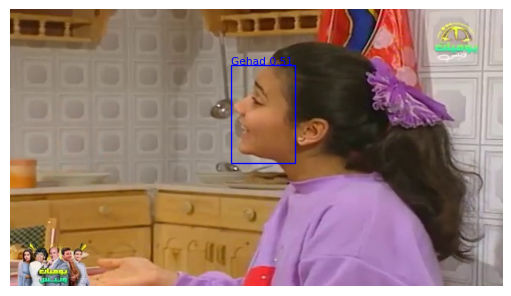

In [107]:
recognize_faces("/kaggle/working/project/data/extracted_frames/frame_1050.jpg", embedding_data, mtcnn, resnet, threshold=0.9)

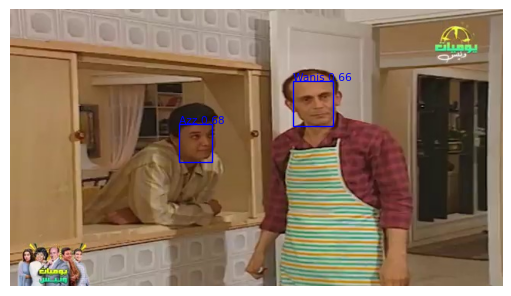

In [106]:
recognize_faces("/kaggle/working/project/data/extracted_frames/frame_1060.jpg", embedding_data, mtcnn, resnet, threshold=0.9)

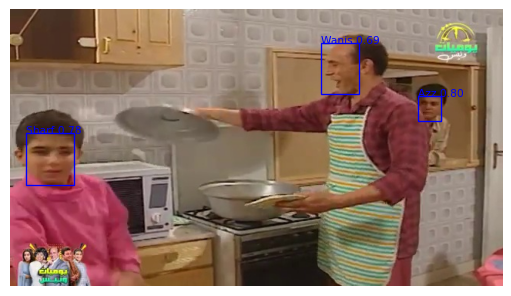

In [121]:
recognize_faces("/kaggle/working/project/data/extracted_frames/frame_1445.jpg", embedding_data, mtcnn, resnet, threshold=0.9)